# Forest Fire & Smoke Prediction using YOLOv8 and YOLOv7

In [112]:
import cv2
import torch
from ultralytics import YOLO
import os
from ultralytics.utils.plotting import Annotator
import yolov7
from colorama import Fore, Style

The following function is used for inference on a single image. The function takes the path to the image, the model(s), and the confidence threshold as input. 

In [116]:
def detect_fire_smoke(yolov8_path, input_path, **kwargs):
    # Outpu dir
    if not os.path.exists("runs"):
        os.mkdir("runs")
        os.mkdir("runs/yolov7")
        os.mkdir("runs/yolov8")

    # Check if model_yolov7 is given in the kwargs
    model_yolov7_path = kwargs.get("yolov7_path", None)
    confidence = kwargs.get("confidence", 0.2)
    
    # Load the models
    model_yolov8 = YOLO(yolov8_path)
    if model_yolov7_path:
        model_yolov7 = yolov7.load(model_yolov7_path)

    # Define colors for bounding boxes for each model
    color_model1 = (0, 255, 0)  # Green for YOLOv8 model

    def draw_boxes(annotator, results, model, color):
        for r in results:
            boxes = r.boxes
            for box in boxes:
                b = box.xyxy[
                    0
                ]  # get box coordinates in (top, left, bottom, right) format
                c = box.cls
                label = f"{model.names[int(c)]} {box.conf.item():.2f}"  # Add confidence to the label
                annotator.box_label(b, label, color=color)

    # Check if the input is an image or a video
    if (
        input_path.endswith(".jpg")
        or input_path.endswith(".png")
        or input_path.endswith(".jpeg")
    ):
        img = cv2.imread(input_path)
        img_copy = img.copy()

        # Predict with both models
        results1 = model_yolov8.predict(img, conf=confidence)

        if model_yolov7_path:
            model_yolov7.conf = confidence
            res = model_yolov7(img_copy, size=640)
            res.save("runs/yolov7")
            
        annotator = Annotator(img)
        draw_boxes(annotator, results1, model_yolov8, color_model1)
        img = annotator.result()

        # Get image name and suffix
        img_name = os.path.basename(input_path)
        # Save the result
        cv2.imwrite(f"runs/yolov8/{img_name}", img)
    else:
        print(f"{Fore.LIGHTYELLOW_EX}Non-image input is not supported yet.{Style.RESET_ALL}")

In [117]:
model_yolov8 = "models/yolov8/weights/fire_model.pt"
model_yolov7 = "models/yolov7/runs/train/exp/weights/best.pt"
input_ = "/Users/lefterisfthenos/Library/CloudStorage/GoogleDrive-fthenosyd@gmail.com/.shortcut-targets-by-id/1qff0NaIEQk7A_s9NBpI4Bvq5LxUnRRld/BA PT_Machine Learning Project/fire dataset 1/Data/Test_Data/Fire/F_9.jpg"

In [124]:
detect_fire_smoke(model_yolov8, input_, **{"yolov7_path": model_yolov7, "confidence": 0.2})

Fusing layers... 
IDetect.fuse



0: 416x640 2 fires, 192.2ms
Speed: 2.1ms preprocess, 192.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


Saved image0.jpg to runs/yolov7


In [125]:
from PIL import Image

# YOLOv8 Prediction results
img_v8 = Image.open(f"runs/yolov8//{os.path.basename(input_)}")
# YOLOv7 Prediction results
if model_yolov7:
    file = os.listdir("runs/yolov7/")[0]
    img_v7 = Image.open(f"runs/yolov7/{file}")

### YOLOv8 Image Predictions

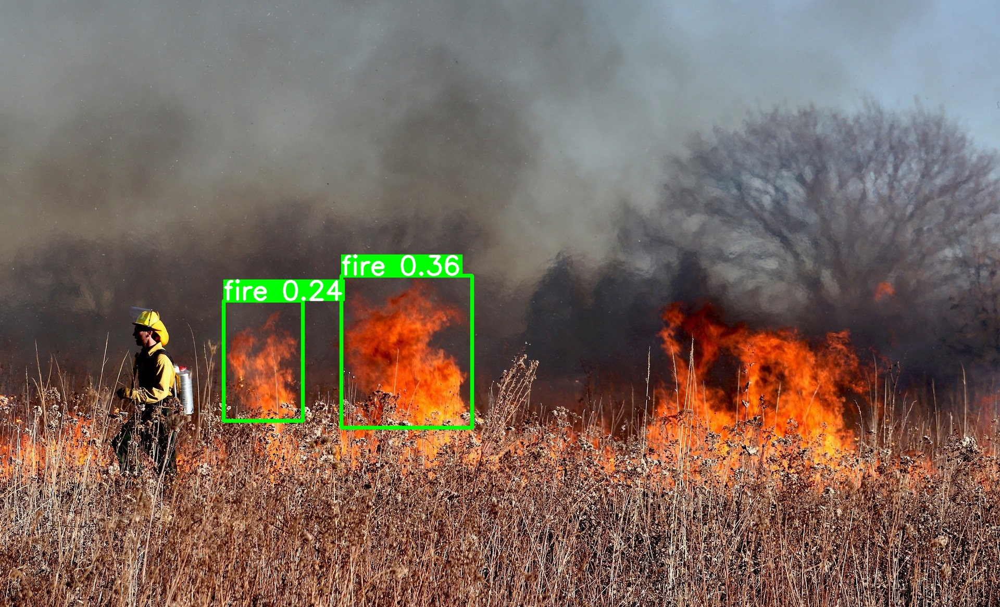

In [127]:
from IPython.display import display

display(img_v8)

### YOLOv7 Image Predictions

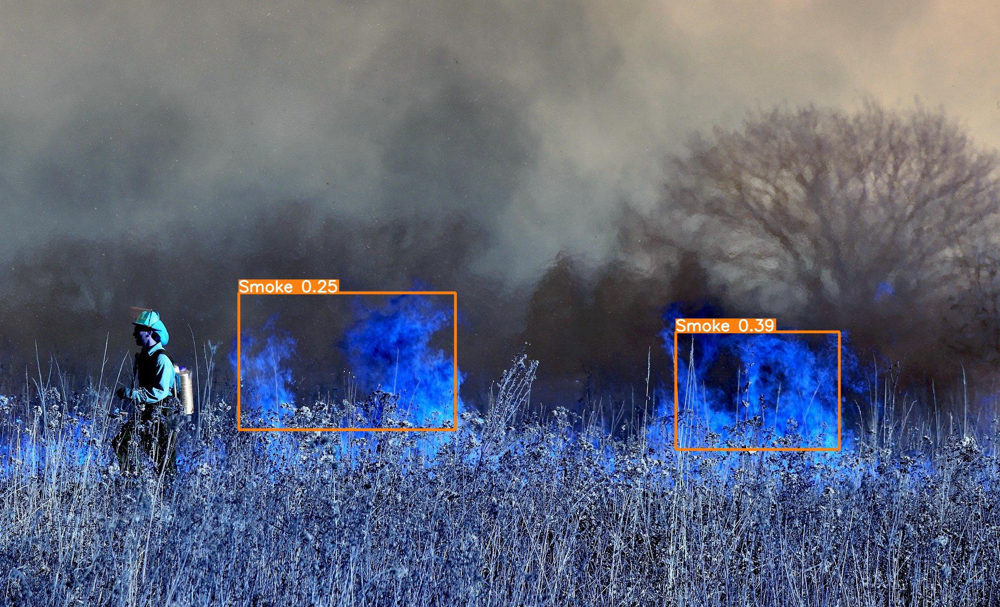

In [128]:
# Display YOLOv7 Prediction results if available
if model_yolov7:
    display(img_v7)